## Phase 2: Data Ingestion & Preprocessing

### Ingest the dataset

In [0]:
# Databricks Notebook
from pyspark.sql import SparkSession

# Initialize Spark Session
spark = SparkSession.builder.appName("Insuranceprediction").getOrCreate()

# Define file path (ensure file is uploaded to /FileStore/tables/)
file_path = "dbfs:/FileStore/user/Car_Insurance_Claim_Prediction.csv"

# Load data into Spark DataFrame (assuming CSV format, adjust accordingly)
df = spark.read.format("csv").option("header", "true").option("inferSchema", "true").load(file_path)


### Using Spark SQL for data exploration and cleaning

In [0]:
# Show schema to understand data types
df.printSchema()

root
 |-- policy_id: string (nullable = true)
 |-- policy_tenure: double (nullable = true)
 |-- age_of_car: double (nullable = true)
 |-- age_of_policyholder: double (nullable = true)
 |-- area_cluster: string (nullable = true)
 |-- population_density: integer (nullable = true)
 |-- make: integer (nullable = true)
 |-- segment: string (nullable = true)
 |-- model: string (nullable = true)
 |-- fuel_type: string (nullable = true)
 |-- max_torque: string (nullable = true)
 |-- max_power: string (nullable = true)
 |-- engine_type: string (nullable = true)
 |-- airbags: integer (nullable = true)
 |-- is_esc: string (nullable = true)
 |-- is_adjustable_steering: string (nullable = true)
 |-- is_tpms: string (nullable = true)
 |-- is_parking_sensors: string (nullable = true)
 |-- is_parking_camera: string (nullable = true)
 |-- rear_brakes_type: string (nullable = true)
 |-- displacement: integer (nullable = true)
 |-- cylinder: integer (nullable = true)
 |-- transmission_type: string (nulla

In [0]:
# Register DataFrame as a temporary SQL table for SQL queries
df.createOrReplaceTempView("insurance_policies")

In [0]:
%sql
--- First 10 rows of data
SELECT * FROM insurance_policies LIMIT 10;

policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,is_esc,is_adjustable_steering,is_tpms,is_parking_sensors,is_parking_camera,rear_brakes_type,displacement,cylinder,transmission_type,gear_box,steering_type,turning_radius,length,width,height,gross_weight,is_front_fog_lights,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim
ID00001,0.515873589958172,0.05,0.644230769230769,C1,4990,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
ID00002,0.672618513547733,0.02,0.375,C2,27003,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
ID00003,0.841110255796233,0.02,0.384615384615385,C3,4076,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0
ID00004,0.900276558749967,0.11,0.432692307692308,C4,21622,1,C1,M2,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,1.2 L K12N Dualjet,2,Yes,Yes,No,Yes,Yes,Drum,1197,4,Automatic,5,Electric,4.8,3995,1735,1515,1335,Yes,No,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
ID00005,0.596402813108729,0.11,0.634615384615385,C5,34738,2,A,M3,Petrol,91Nm@4250rpm,67.06bhp@5500rpm,1.0 SCe,2,No,No,No,No,Yes,Drum,999,3,Automatic,5,Electric,5.0,3731,1579,1490,1155,No,No,No,No,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0
ID00006,1.01870853782142,0.07,0.519230769230769,C6,13051,3,C2,M4,Diesel,250Nm@2750rpm,113.45bhp@4000rpm,1.5 L U2 CRDi,6,Yes,Yes,Yes,Yes,Yes,Disc,1493,4,Automatic,6,Power,5.2,4300,1790,1635,1720,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,3,0
ID00007,0.097992157807911,0.16,0.403846153846154,C7,6112,4,B2,M5,Diesel,200Nm@3000rpm,88.77bhp@4000rpm,1.5 Turbocharged Revotorq,2,No,Yes,No,Yes,No,Drum,1497,4,Manual,5,Electric,5.0,3990,1755,1523,1490,No,No,No,No,No,Yes,Yes,Yes,No,No,Yes,Yes,5,0
ID00008,0.509084671398517,0.14,0.423076923076923,C8,8794,1,B2,M6,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,K Series Dual jet,2,No,Yes,No,Yes,No,Drum,1197,4,Manual,5,Electric,4.8,3845,1735,1530,1335,Yes,No,No,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0
ID00009,0.282393518287139,0.07,0.298076923076923,C7,6112,3,C2,M4,Diesel,250Nm@2750rpm,113.45bhp@4000rpm,1.5 L U2 CRDi,6,Yes,Yes,Yes,Yes,Yes,Disc,1493,4,Automatic,6,Power,5.2,4300,1790,1635,1720,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,3,0
ID00010,0.566255432742967,0.04,0.442307692307692,C9,17804,1,B2,M7,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,1.2 L K Series Engine,6,Yes,Yes,No,Yes,Yes,Drum,1197,4,Automatic,5,Electric,4.85,3990,1745,1500,1410,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,0


In [0]:
%sql
---column statistics
DESCRIBE insurance_policies

col_name,data_type,comment
policy_id,string,null
policy_tenure,double,null
age_of_car,double,null
age_of_policyholder,double,null
area_cluster,string,null
population_density,int,null
make,int,null
segment,string,null
model,string,null
fuel_type,string,null


In [0]:
%sql
---checking for null counts for columns
SELECT 
    COUNT(*) AS total_records,
    SUM(CASE WHEN policy_id IS NULL THEN 1 ELSE 0 END) AS null_policy_id,
    SUM(CASE WHEN policy_tenure IS NULL THEN 1 ELSE 0 END) AS null_policy_tenure,
    SUM(CASE WHEN age_of_car IS NULL THEN 1 ELSE 0 END) AS null_age_of_car,
    SUM(CASE WHEN age_of_policyholder IS NULL THEN 1 ELSE 0 END) AS null_age_of_policyholder,
    SUM(CASE WHEN area_cluster IS NULL THEN 1 ELSE 0 END) AS null_area_cluster,
    SUM(CASE WHEN population_density IS NULL THEN 1 ELSE 0 END) AS null_population_density,
    SUM(CASE WHEN make IS NULL THEN 1 ELSE 0 END) AS null_make,
    SUM(CASE WHEN segment IS NULL THEN 1 ELSE 0 END) AS null_segment,
    SUM(CASE WHEN model IS NULL THEN 1 ELSE 0 END) AS null_model,
    SUM(CASE WHEN fuel_type IS NULL THEN 1 ELSE 0 END) AS null_fuel_type,
    SUM(CASE WHEN max_torque IS NULL THEN 1 ELSE 0 END) AS null_max_torque,
    SUM(CASE WHEN max_power IS NULL THEN 1 ELSE 0 END) AS null_max_power,
    SUM(CASE WHEN engine_type IS NULL THEN 1 ELSE 0 END) AS null_engine_type,
    SUM(CASE WHEN airbags IS NULL THEN 1 ELSE 0 END) AS null_airbags,
    SUM(CASE WHEN is_esc IS NULL THEN 1 ELSE 0 END) AS null_is_esc,
    SUM(CASE WHEN is_adjustable_steering IS NULL THEN 1 ELSE 0 END) AS null_is_adjustable_steering,
    SUM(CASE WHEN is_tpms IS NULL THEN 1 ELSE 0 END) AS null_is_tpms,
    SUM(CASE WHEN is_parking_sensors IS NULL THEN 1 ELSE 0 END) AS null_is_parking_sensors,
    SUM(CASE WHEN is_parking_camera IS NULL THEN 1 ELSE 0 END) AS null_is_parking_camera,
    SUM(CASE WHEN rear_brakes_type IS NULL THEN 1 ELSE 0 END) AS null_rear_brakes_type,
    SUM(CASE WHEN displacement IS NULL THEN 1 ELSE 0 END) AS null_displacement,
    SUM(CASE WHEN cylinder IS NULL THEN 1 ELSE 0 END) AS null_cylinder,
    SUM(CASE WHEN transmission_type IS NULL THEN 1 ELSE 0 END) AS null_transmission_type,
    SUM(CASE WHEN gear_box IS NULL THEN 1 ELSE 0 END) AS null_gear_box,
    SUM(CASE WHEN steering_type IS NULL THEN 1 ELSE 0 END) AS null_steering_type,
    SUM(CASE WHEN turning_radius IS NULL THEN 1 ELSE 0 END) AS null_turning_radius,
    SUM(CASE WHEN length IS NULL THEN 1 ELSE 0 END) AS null_length,
    SUM(CASE WHEN width IS NULL THEN 1 ELSE 0 END) AS null_width,
    SUM(CASE WHEN height IS NULL THEN 1 ELSE 0 END) AS null_height,
    SUM(CASE WHEN gross_weight IS NULL THEN 1 ELSE 0 END) AS null_gross_weight,
    SUM(CASE WHEN is_front_fog_lights IS NULL THEN 1 ELSE 0 END) AS null_is_front_fog_lights,
    SUM(CASE WHEN is_rear_window_wiper IS NULL THEN 1 ELSE 0 END) AS null_is_rear_window_wiper,
    SUM(CASE WHEN is_rear_window_washer IS NULL THEN 1 ELSE 0 END) AS null_is_rear_window_washer,
    SUM(CASE WHEN is_rear_window_defogger IS NULL THEN 1 ELSE 0 END) AS null_is_rear_window_defogger,
    SUM(CASE WHEN is_brake_assist IS NULL THEN 1 ELSE 0 END) AS null_is_brake_assist,
    SUM(CASE WHEN is_power_door_locks IS NULL THEN 1 ELSE 0 END) AS null_is_power_door_locks,
    SUM(CASE WHEN is_central_locking IS NULL THEN 1 ELSE 0 END) AS null_is_central_locking,
    SUM(CASE WHEN is_power_steering IS NULL THEN 1 ELSE 0 END) AS null_is_power_steering,
    SUM(CASE WHEN is_driver_seat_height_adjustable IS NULL THEN 1 ELSE 0 END) AS null_is_driver_seat_height_adjustable,
    SUM(CASE WHEN is_day_night_rear_view_mirror IS NULL THEN 1 ELSE 0 END) AS null_is_day_night_rear_view_mirror,
    SUM(CASE WHEN is_ecw IS NULL THEN 1 ELSE 0 END) AS null_is_ecw,
    SUM(CASE WHEN is_speed_alert IS NULL THEN 1 ELSE 0 END) AS null_is_speed_alert,
    SUM(CASE WHEN ncap_rating IS NULL THEN 1 ELSE 0 END) AS null_ncap_rating,
    SUM(CASE WHEN is_claim IS NULL THEN 1 ELSE 0 END) AS null_is_claim
FROM insurance_policies;

total_records,null_policy_id,null_policy_tenure,null_age_of_car,null_age_of_policyholder,null_area_cluster,null_population_density,null_make,null_segment,null_model,null_fuel_type,null_max_torque,null_max_power,null_engine_type,null_airbags,null_is_esc,null_is_adjustable_steering,null_is_tpms,null_is_parking_sensors,null_is_parking_camera,null_rear_brakes_type,null_displacement,null_cylinder,null_transmission_type,null_gear_box,null_steering_type,null_turning_radius,null_length,null_width,null_height,null_gross_weight,null_is_front_fog_lights,null_is_rear_window_wiper,null_is_rear_window_washer,null_is_rear_window_defogger,null_is_brake_assist,null_is_power_door_locks,null_is_central_locking,null_is_power_steering,null_is_driver_seat_height_adjustable,null_is_day_night_rear_view_mirror,null_is_ecw,null_is_speed_alert,null_ncap_rating,null_is_claim
58592,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
%sql
--- removing duplicate columns from the dataset
CREATE OR REPLACE TEMP VIEW cleaned_policies AS 
SELECT DISTINCT * FROM insurance_policies;

### Categorical encoding with one hot encoding 

####Updated table with encoded values/binary values

In [0]:
%sql
SELECT 
    -- Fuel Type Encoding
    fuel_type,
    CASE WHEN fuel_type = 'Diesel' THEN 1 ELSE 0 END AS fuel_type_Diesel,
    CASE WHEN fuel_type = 'CNG' THEN 1 ELSE 0 END AS fuel_type_CNG,
    CASE WHEN fuel_type = 'Petrol' THEN 1 ELSE 0 END AS fuel_type_Petrol,

    -- Rear Brakes Type Encoding
    rear_brakes_type,
    CASE WHEN rear_brakes_type = 'Drum' THEN 1 ELSE 0 END AS rear_brakes_type_Drum,
    CASE WHEN rear_brakes_type = 'Disc' THEN 1 ELSE 0 END AS rear_brakes_type_Disc,

    -- Transmission Type Encoding
    transmission_type,
    CASE WHEN transmission_type = 'Automatic' THEN 1 ELSE 0 END AS transmission_type_Automatic,
    CASE WHEN transmission_type = 'Manual' THEN 1 ELSE 0 END AS transmission_type_Manual,

    -- Steering Type Encoding
    steering_type,
    CASE WHEN steering_type = 'Power' THEN 1 ELSE 0 END AS steering_type_Power,
    CASE WHEN steering_type = 'Manual' THEN 1 ELSE 0 END AS steering_type_Manual,
    CASE WHEN steering_type = 'Electric' THEN 1 ELSE 0 END AS steering_type_Electric

FROM insurance_policies;


fuel_type,fuel_type_Diesel,fuel_type_CNG,fuel_type_Petrol,rear_brakes_type,rear_brakes_type_Drum,rear_brakes_type_Disc,transmission_type,transmission_type_Automatic,transmission_type_Manual,steering_type,steering_type_Power,steering_type_Manual,steering_type_Electric
CNG,0,1,0,Drum,1,0,Manual,0,1,Power,1,0,0
CNG,0,1,0,Drum,1,0,Manual,0,1,Power,1,0,0
CNG,0,1,0,Drum,1,0,Manual,0,1,Power,1,0,0
Petrol,0,0,1,Drum,1,0,Automatic,1,0,Electric,0,0,1
Petrol,0,0,1,Drum,1,0,Automatic,1,0,Electric,0,0,1
Diesel,1,0,0,Disc,0,1,Automatic,1,0,Power,1,0,0
Diesel,1,0,0,Drum,1,0,Manual,0,1,Electric,0,0,1
Petrol,0,0,1,Drum,1,0,Manual,0,1,Electric,0,0,1
Diesel,1,0,0,Disc,0,1,Automatic,1,0,Power,1,0,0
Petrol,0,0,1,Drum,1,0,Automatic,1,0,Electric,0,0,1


In [0]:
%sql
---convert Boolean-Like Strings to 0/1
SELECT 
    CASE WHEN is_esc = 'Yes' THEN 1 ELSE 0 END AS is_esc_numeric,
    CASE WHEN is_adjustable_steering = 'Yes' THEN 1 ELSE 0 END AS is_adjustable_steering_numeric,
    CASE WHEN is_tpms = 'Yes' THEN 1 ELSE 0 END AS is_tpms_numeric,
    CASE WHEN is_parking_sensors = 'Yes' THEN 1 ELSE 0 END AS is_parking_sensors_numeric,
    CASE WHEN is_parking_camera = 'Yes' THEN 1 ELSE 0 END AS is_parking_camera_numeric,
    CASE WHEN is_front_fog_lights = 'Yes' THEN 1 ELSE 0 END AS is_front_fog_lights_numeric,
    CASE WHEN is_rear_window_wiper = 'Yes' THEN 1 ELSE 0 END AS is_rear_window_wiper_numeric,
    CASE WHEN is_rear_window_washer = 'Yes' THEN 1 ELSE 0 END AS is_rear_window_washer_numeric,
    CASE WHEN is_rear_window_defogger = 'Yes' THEN 1 ELSE 0 END AS is_rear_window_defogger_numeric,
    CASE WHEN is_brake_assist = 'Yes' THEN 1 ELSE 0 END AS is_brake_assist_numeric,
    CASE WHEN is_power_door_locks = 'Yes' THEN 1 ELSE 0 END AS is_power_door_locks_numeric,
    CASE WHEN is_central_locking = 'Yes' THEN 1 ELSE 0 END AS is_central_locking_numeric,
    CASE WHEN is_power_steering = 'Yes' THEN 1 ELSE 0 END AS is_power_steering_numeric,
    CASE WHEN is_driver_seat_height_adjustable = 'Yes' THEN 1 ELSE 0 END AS is_driver_seat_height_adjustable_numeric,
    CASE WHEN is_day_night_rear_view_mirror = 'Yes' THEN 1 ELSE 0 END AS is_day_night_rear_view_mirror_numeric,
    CASE WHEN is_ecw = 'Yes' THEN 1 ELSE 0 END AS is_ecw_numeric,
    CASE WHEN is_speed_alert = 'Yes' THEN 1 ELSE 0 END AS is_speed_alert_numeric
FROM insurance_policies;

is_esc_numeric,is_adjustable_steering_numeric,is_tpms_numeric,is_parking_sensors_numeric,is_parking_camera_numeric,is_front_fog_lights_numeric,is_rear_window_wiper_numeric,is_rear_window_washer_numeric,is_rear_window_defogger_numeric,is_brake_assist_numeric,is_power_door_locks_numeric,is_central_locking_numeric,is_power_steering_numeric,is_driver_seat_height_adjustable_numeric,is_day_night_rear_view_mirror_numeric,is_ecw_numeric,is_speed_alert_numeric
0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
1,1,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1
0,0,0,0,1,0,0,0,0,0,1,1,1,0,1,1,1
1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
0,1,0,1,0,0,0,0,0,0,1,1,1,0,0,1,1
0,1,0,1,0,1,0,0,0,1,1,1,1,1,1,1,1
1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [0]:
%sql
---checking unique values in categorical columns
SELECT 
    COUNT(DISTINCT make) AS unique_makes,
    COUNT(DISTINCT model) AS unique_models,
    COUNT(DISTINCT fuel_type) AS unique_fuel_types,
    COUNT(DISTINCT segment) AS unique_segments, 
    COUNT(DISTINCT area_cluster) AS unique_area_cluster, 
    COUNT(DISTINCT engine_type) AS unique_engine_type, 
    COUNT(DISTINCT rear_brakes_type) AS unique_rear_brakes_type,
    COUNT(DISTINCT transmission_type) AS unique_transmission_type, 
    COUNT(DISTINCT steering_type) AS unique_steering_type
FROM insurance_policies;


unique_makes,unique_models,unique_fuel_types,unique_segments,unique_area_cluster,unique_engine_type,unique_rear_brakes_type,unique_transmission_type,unique_steering_type
5,11,3,6,22,11,2,2,3


In [0]:
%sql
CREATE OR REPLACE TABLE insurance_policies_new AS 
SELECT 
    *,
    
    -- Fuel Type Encoding
    CASE WHEN fuel_type = 'Diesel' THEN 1 ELSE 0 END AS fuel_type_Diesel,
    CASE WHEN fuel_type = 'CNG' THEN 1 ELSE 0 END AS fuel_type_CNG,
    CASE WHEN fuel_type = 'Petrol' THEN 1 ELSE 0 END AS fuel_type_Petrol,

    -- Rear Brakes Type Encoding
    CASE WHEN rear_brakes_type = 'Drum' THEN 1 ELSE 0 END AS rear_brakes_type_Drum,
    CASE WHEN rear_brakes_type = 'Disc' THEN 1 ELSE 0 END AS rear_brakes_type_Disc,

    -- Transmission Type Encoding
    CASE WHEN transmission_type = 'Automatic' THEN 1 ELSE 0 END AS transmission_type_Automatic,
    CASE WHEN transmission_type = 'Manual' THEN 1 ELSE 0 END AS transmission_type_Manual,

    -- Steering Type Encoding
    CASE WHEN steering_type = 'Power' THEN 1 ELSE 0 END AS steering_type_Power,
    CASE WHEN steering_type = 'Manual' THEN 1 ELSE 0 END AS steering_type_Manual,
    CASE WHEN steering_type = 'Electric' THEN 1 ELSE 0 END AS steering_type_Electric,

    -- Boolean Feature Encoding
    CASE WHEN is_esc = 'Yes' THEN '1' ELSE '0' END AS is_esc_num,
    CASE WHEN is_adjustable_steering = 'Yes' THEN '1' ELSE '0' END AS is_adjustable_steering_num,
    CASE WHEN is_tpms = 'Yes' THEN '1' ELSE '0' END AS is_tpms_num,
    CASE WHEN is_parking_sensors = 'Yes' THEN '1' ELSE '0' END AS is_parking_sensors_num,
    CASE WHEN is_parking_camera = 'Yes' THEN '1' ELSE '0' END AS is_parking_camera_num,
    CASE WHEN is_front_fog_lights = 'Yes' THEN '1' ELSE '0' END AS is_front_fog_lights_num,
    CASE WHEN is_rear_window_wiper = 'Yes' THEN '1' ELSE '0' END AS is_rear_window_wiper_num,
    CASE WHEN is_rear_window_washer = 'Yes' THEN '1' ELSE '0' END AS is_rear_window_washer_num,
    CASE WHEN is_rear_window_defogger = 'Yes' THEN '1' ELSE '0' END AS is_rear_window_defogger_num,
    CASE WHEN is_brake_assist = 'Yes' THEN '1' ELSE '0' END AS is_brake_assist_num,
    CASE WHEN is_power_door_locks = 'Yes' THEN '1' ELSE '0' END AS is_power_door_locks_num,
    CASE WHEN is_central_locking = 'Yes' THEN '1' ELSE '0' END AS is_central_locking_num,
    CASE WHEN is_power_steering = 'Yes' THEN '1' ELSE '0' END AS is_power_steering_num,
    CASE WHEN is_driver_seat_height_adjustable = 'Yes' THEN '1' ELSE '0' END AS is_driver_seat_height_adjustable_num,
    CASE WHEN is_day_night_rear_view_mirror = 'Yes' THEN '1' ELSE '0' END AS is_day_night_rear_view_mirror_num,
    CASE WHEN is_ecw = 'Yes' THEN '1' ELSE '0' END AS is_ecw_num,
    CASE WHEN is_speed_alert = 'Yes' THEN '1' ELSE '0' END AS is_speed_alert_num

FROM insurance_policies;


num_affected_rows,num_inserted_rows


In [0]:
spark.conf.set("spark.databricks.delta.alterTable.rename.enabledOnAWS", "true")

In [0]:
%sql
ALTER TABLE insurance_policies_new RENAME TO insurance_policies_nnnn;

In [0]:
%sql
Select * from insurance_policies_nnn limit 5;

policy_id,policy_tenure,age_of_car,age_of_policyholder,area_cluster,population_density,make,segment,model,fuel_type,max_torque,max_power,engine_type,airbags,is_esc,is_adjustable_steering,is_tpms,is_parking_sensors,is_parking_camera,rear_brakes_type,displacement,cylinder,transmission_type,gear_box,steering_type,turning_radius,length,width,height,gross_weight,is_front_fog_lights,is_rear_window_wiper,is_rear_window_washer,is_rear_window_defogger,is_brake_assist,is_power_door_locks,is_central_locking,is_power_steering,is_driver_seat_height_adjustable,is_day_night_rear_view_mirror,is_ecw,is_speed_alert,ncap_rating,is_claim,fuel_type_Diesel,fuel_type_CNG,fuel_type_Petrol,rear_brakes_type_Drum,rear_brakes_type_Disc,transmission_type_Automatic,transmission_type_Manual,steering_type_Power,steering_type_Manual,steering_type_Electric,is_esc_num,is_adjustable_steering_num,is_tpms_num,is_parking_sensors_num,is_parking_camera_num,is_front_fog_lights_num,is_rear_window_wiper_num,is_rear_window_washer_num,is_rear_window_defogger_num,is_brake_assist_num,is_power_door_locks_num,is_central_locking_num,is_power_steering_num,is_driver_seat_height_adjustable_num,is_day_night_rear_view_mirror_num,is_ecw_num,is_speed_alert_num
ID00001,0.515873589958172,0.05,0.644230769230769,C1,4990,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
ID00002,0.672618513547733,0.02,0.375,C2,27003,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
ID00003,0.841110255796233,0.02,0.384615384615385,C3,4076,1,A,M1,CNG,60Nm@3500rpm,40.36bhp@6000rpm,F8D Petrol Engine,2,No,No,No,Yes,No,Drum,796,3,Manual,5,Power,4.6,3445,1515,1475,1185,No,No,No,No,No,No,No,Yes,No,No,No,Yes,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
ID00004,0.900276558749967,0.11,0.432692307692308,C4,21622,1,C1,M2,Petrol,113Nm@4400rpm,88.50bhp@6000rpm,1.2 L K12N Dualjet,2,Yes,Yes,No,Yes,Yes,Drum,1197,4,Automatic,5,Electric,4.8,3995,1735,1515,1335,Yes,No,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,2,0,0,0,1,1,0,1,0,0,0,1,1,1,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1
ID00005,0.596402813108729,0.11,0.634615384615385,C5,34738,2,A,M3,Petrol,91Nm@4250rpm,67.06bhp@5500rpm,1.0 SCe,2,No,No,No,No,Yes,Drum,999,3,Automatic,5,Electric,5.0,3731,1579,1490,1155,No,No,No,No,No,Yes,Yes,Yes,No,Yes,Yes,Yes,2,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,1,0,1,1,1


###Optimizing data storage using Parquet format

In [0]:
%sql
CREATE TABLE insurance_policies_parquet_nnnn
USING PARQUET 
AS SELECT * FROM insurance_policies_nnnn;

## Phase 3: Exploratory Data Analysis (EDA)

In [0]:
# location of the table insurance_policies_parquest
table_location = spark.sql("DESCRIBE EXTENDED insurance_policies_parquet_nnnn") \
    .filter("col_name = 'Location'") \
    .select("data_type") \
    .collect()[0][0]

print(f"Table Path: {table_location}")

Table Path: dbfs:/user/hive/warehouse/insurance_policies_parquet_nnnn


In [0]:
# Load Parquet
df = spark.read.format("parquet").load("dbfs:/user/hive/warehouse/insurance_policies_parquet_nnnn")

df.printSchema()  # Verify the schema

root
 |-- policy_id: string (nullable = true)
 |-- policy_tenure: double (nullable = true)
 |-- age_of_car: double (nullable = true)
 |-- age_of_policyholder: double (nullable = true)
 |-- area_cluster: string (nullable = true)
 |-- population_density: integer (nullable = true)
 |-- make: integer (nullable = true)
 |-- segment: string (nullable = true)
 |-- model: string (nullable = true)
 |-- fuel_type: string (nullable = true)
 |-- max_torque: string (nullable = true)
 |-- max_power: string (nullable = true)
 |-- engine_type: string (nullable = true)
 |-- airbags: integer (nullable = true)
 |-- is_esc: string (nullable = true)
 |-- is_adjustable_steering: string (nullable = true)
 |-- is_tpms: string (nullable = true)
 |-- is_parking_sensors: string (nullable = true)
 |-- is_parking_camera: string (nullable = true)
 |-- rear_brakes_type: string (nullable = true)
 |-- displacement: integer (nullable = true)
 |-- cylinder: integer (nullable = true)
 |-- transmission_type: string (nulla

In [0]:
from pyspark.sql.functions import col

# ✅ Step 1: List of Binary Columns to Convert from String to Integer
binary_columns = [
    "is_esc_num", "is_adjustable_steering_num", "is_tpms_num", "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num", 
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num", "is_brake_assist_num", 
    "is_power_door_locks_num", "is_central_locking_num", "is_power_steering_num", "is_driver_seat_height_adjustable_num", 
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# ✅ Convert String Binary Columns ("0"/"1") to Integer
for column in binary_columns:
    df = df.withColumn(column, col(column).cast("integer"))

# ✅ Step 2: Drop Unnecessary Categorical Columns
columns_to_drop = ["fuel_type", "rear_brakes_type", "transmission_type", "steering_type", "is_esc", "is_adjustable_steering", "is_tpms", "is_parking_sensors","is_parking_camera", "is_front_fog_lights", 
    "is_rear_window_wiper", "is_rear_window_washer", "is_rear_window_defogger", "is_brake_assist", 
    "is_power_door_locks", "is_central_locking", "is_power_steering", "is_driver_seat_height_adjustable", 
    "is_day_night_rear_view_mirror", "is_ecw", "is_speed_alert"]
df = df.drop(*columns_to_drop)

# ✅ Show Updated Schema to Verify Changes
df.printSchema()

# ✅ Show First 5 Rows to Verify Data
df.show(5)

root
 |-- policy_id: string (nullable = true)
 |-- policy_tenure: double (nullable = true)
 |-- age_of_car: double (nullable = true)
 |-- age_of_policyholder: double (nullable = true)
 |-- area_cluster: string (nullable = true)
 |-- population_density: integer (nullable = true)
 |-- make: integer (nullable = true)
 |-- segment: string (nullable = true)
 |-- model: string (nullable = true)
 |-- max_torque: string (nullable = true)
 |-- max_power: string (nullable = true)
 |-- engine_type: string (nullable = true)
 |-- airbags: integer (nullable = true)
 |-- displacement: integer (nullable = true)
 |-- cylinder: integer (nullable = true)
 |-- gear_box: integer (nullable = true)
 |-- turning_radius: double (nullable = true)
 |-- length: integer (nullable = true)
 |-- width: integer (nullable = true)
 |-- height: integer (nullable = true)
 |-- gross_weight: integer (nullable = true)
 |-- ncap_rating: integer (nullable = true)
 |-- is_claim: integer (nullable = true)
 |-- fuel_type_Diesel: 

In [0]:
df.show(10, truncate=False)

+---------+-----------------+----------+-------------------+------------+------------------+----+-------+-----+-------------+-----------------+-------------------------+-------+------------+--------+--------+--------------+------+-----+------+------------+-----------+--------+----------------+-------------+----------------+---------------------+---------------------+---------------------------+------------------------+-------------------+--------------------+----------------------+----------+--------------------------+-----------+----------------------+---------------------+-----------------------+------------------------+-------------------------+---------------------------+-------------------+-----------------------+----------------------+---------------------+------------------------------------+---------------------------------+----------+------------------+
|policy_id|policy_tenure    |age_of_car|age_of_policyholder|area_cluster|population_density|make|segment|model|max_torque   |

In [0]:
#print schema
df.printSchema() 

root
 |-- policy_id: string (nullable = true)
 |-- policy_tenure: double (nullable = true)
 |-- age_of_car: double (nullable = true)
 |-- age_of_policyholder: double (nullable = true)
 |-- area_cluster: string (nullable = true)
 |-- population_density: integer (nullable = true)
 |-- make: integer (nullable = true)
 |-- segment: string (nullable = true)
 |-- model: string (nullable = true)
 |-- max_torque: string (nullable = true)
 |-- max_power: string (nullable = true)
 |-- engine_type: string (nullable = true)
 |-- airbags: integer (nullable = true)
 |-- displacement: integer (nullable = true)
 |-- cylinder: integer (nullable = true)
 |-- gear_box: integer (nullable = true)
 |-- turning_radius: double (nullable = true)
 |-- length: integer (nullable = true)
 |-- width: integer (nullable = true)
 |-- height: integer (nullable = true)
 |-- gross_weight: integer (nullable = true)
 |-- ncap_rating: integer (nullable = true)
 |-- is_claim: integer (nullable = true)
 |-- fuel_type_Diesel: 

### Summary Statistics

In [0]:
#Basic summary statistics
df.describe().show()

+-------+---------+------------------+-------------------+-------------------+------------+------------------+------------------+-------+-----+-------------+-----------------+-----------+------------------+------------------+-------------------+------------------+-------------------+------------------+------------------+------------------+------------------+------------------+-------------------+-------------------+------------------+-------------------+---------------------+---------------------+---------------------------+------------------------+-------------------+--------------------+----------------------+------------------+--------------------------+-------------------+----------------------+---------------------+-----------------------+------------------------+-------------------------+---------------------------+-------------------+-----------------------+----------------------+---------------------+------------------------------------+---------------------------------+-------

In [0]:
# Specifc Statistics for numerical columns
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, count, mean, stddev, min, max

# Select numerical columns for summary statistics
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", 
    "make", "airbags", "displacement", "cylinder", "gear_box", "turning_radius", 
    "length", "width", "height", "gross_weight", "ncap_rating", "is_claim",
    "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc",
    "transmission_type_Automatic", "transmission_type_Manual",
    "steering_type_Power", "steering_type_Manual", "steering_type_Electric",
    "is_esc_num", "is_adjustable_steering_num", "is_tpms_num", 
    "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num",
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num",
    "is_brake_assist_num", "is_power_door_locks_num", "is_central_locking_num",
    "is_power_steering_num", "is_driver_seat_height_adjustable_num",
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# Generate summary statistics for numerical columns
summary_stats = df.select(
    [count(col(c)).alias(f"{c}_count") for c in numerical_cols] +
    [mean(col(c)).alias(f"{c}_mean") for c in numerical_cols] +
    [stddev(col(c)).alias(f"{c}_stddev") for c in numerical_cols] +
    [min(col(c)).alias(f"{c}_min") for c in numerical_cols] +
    [max(col(c)).alias(f"{c}_max") for c in numerical_cols]
)

# Show summary statistics
display(summary_stats)

policy_tenure_count,age_of_car_count,age_of_policyholder_count,population_density_count,make_count,airbags_count,displacement_count,cylinder_count,gear_box_count,turning_radius_count,length_count,width_count,height_count,gross_weight_count,ncap_rating_count,is_claim_count,fuel_type_Diesel_count,fuel_type_CNG_count,fuel_type_Petrol_count,rear_brakes_type_Drum_count,rear_brakes_type_Disc_count,transmission_type_Automatic_count,transmission_type_Manual_count,steering_type_Power_count,steering_type_Manual_count,steering_type_Electric_count,is_esc_num_count,is_adjustable_steering_num_count,is_tpms_num_count,is_parking_sensors_num_count,is_parking_camera_num_count,is_front_fog_lights_num_count,is_rear_window_wiper_num_count,is_rear_window_washer_num_count,is_rear_window_defogger_num_count,is_brake_assist_num_count,is_power_door_locks_num_count,is_central_locking_num_count,is_power_steering_num_count,is_driver_seat_height_adjustable_num_count,is_day_night_rear_view_mirror_num_count,is_ecw_num_count,is_speed_alert_num_count,policy_tenure_mean,age_of_car_mean,age_of_policyholder_mean,population_density_mean,make_mean,airbags_mean,displacement_mean,cylinder_mean,gear_box_mean,turning_radius_mean,length_mean,width_mean,height_mean,gross_weight_mean,ncap_rating_mean,is_claim_mean,fuel_type_Diesel_mean,fuel_type_CNG_mean,fuel_type_Petrol_mean,rear_brakes_type_Drum_mean,rear_brakes_type_Disc_mean,transmission_type_Automatic_mean,transmission_type_Manual_mean,steering_type_Power_mean,steering_type_Manual_mean,steering_type_Electric_mean,is_esc_num_mean,is_adjustable_steering_num_mean,is_tpms_num_mean,is_parking_sensors_num_mean,is_parking_camera_num_mean,is_front_fog_lights_num_mean,is_rear_window_wiper_num_mean,is_rear_window_washer_num_mean,is_rear_window_defogger_num_mean,is_brake_assist_num_mean,is_power_door_locks_num_mean,is_central_locking_num_mean,is_power_steering_num_mean,is_driver_seat_height_adjustable_num_mean,is_day_night_rear_view_mirror_num_mean,is_ecw_num_mean,is_speed_alert_num_mean,policy_tenure_stddev,age_of_car_stddev,age_of_policyholder_stddev,population_density_stddev,make_stddev,airbags_stddev,displacement_stddev,cylinder_stddev,gear_box_stddev,turning_radius_stddev,length_stddev,width_stddev,height_stddev,gross_weight_stddev,ncap_rating_stddev,is_claim_stddev,fuel_type_Diesel_stddev,fuel_type_CNG_stddev,fuel_type_Petrol_stddev,rear_brakes_type_Drum_stddev,rear_brakes_type_Disc_stddev,transmission_type_Automatic_stddev,transmission_type_Manual_stddev,steering_type_Power_stddev,steering_type_Manual_stddev,steering_type_Electric_stddev,is_esc_num_stddev,is_adjustable_steering_num_stddev,is_tpms_num_stddev,is_parking_sensors_num_stddev,is_parking_camera_num_stddev,is_front_fog_lights_num_stddev,is_rear_window_wiper_num_stddev,is_rear_window_washer_num_stddev,is_rear_window_defogger_num_stddev,is_brake_assist_num_stddev,is_power_door_locks_num_stddev,is_central_locking_num_stddev,is_power_steering_num_stddev,is_driver_seat_height_adjustable_num_stddev,is_day_night_rear_view_mirror_num_stddev,is_ecw_num_stddev,is_speed_alert_num_stddev,policy_tenure_min,age_of_car_min,age_of_policyholder_min,population_density_min,make_min,airbags_min,displacement_min,cylinder_min,gear_box_min,turning_radius_min,length_min,width_min,height_min,gross_weight_min,ncap_rating_min,is_claim_min,fuel_type_Diesel_min,fuel_type_CNG_min,fuel_type_Petrol_min,rear_brakes_type_Drum_min,rear_brakes_type_Disc_min,transmission_type_Automatic_min,transmission_type_Manual_min,steering_type_Power_min,steering_type_Manual_min,steering_type_Electric_min,is_esc_num_min,is_adjustable_steering_num_min,is_tpms_num_min,is_parking_sensors_num_min,is_parking_camera_num_min,is_front_fog_lights_num_min,is_rear_window_wiper_num_min,is_rear_window_washer_num_min,is_rear_window_defogger_num_min,is_brake_assist_num_min,is_power_door_locks_num_min,is_central_locking_num_min,is_power_steering_num_min,is_driver_seat_height_adjustable_num_min,is_day_night_rear_view_mirror_num_

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, count

# Define categorical columns
categorical_cols = [
    "policy_id", "area_cluster", "segment", "model", "max_torque", 
    "max_power", "engine_type"
]

# Generate value counts for each categorical column
for col_name in categorical_cols:
    print(f"Value Counts for {col_name}:")
    df.groupBy(col_name).count().orderBy(col("count").desc()).show(10)  # Show top 10 values

Value Counts for policy_id:
+---------+-----+
|policy_id|count|
+---------+-----+
|  ID00278|    1|
|  ID00286|    1|
|  ID01043|    1|
|  ID01220|    1|
|  ID01373|    1|
|  ID01878|    1|
|  ID01921|    1|
|  ID01994|    1|
|  ID02334|    1|
|  ID02461|    1|
+---------+-----+
only showing top 10 rows

Value Counts for area_cluster:
+------------+-----+
|area_cluster|count|
+------------+-----+
|          C8|13654|
|          C2| 7342|
|          C5| 6979|
|          C3| 6101|
|         C14| 3660|
|         C13| 3423|
|         C10| 3155|
|          C9| 2734|
|          C7| 2167|
|         C12| 1589|
+------------+-----+
only showing top 10 rows

Value Counts for segment:
+-------+-----+
|segment|count|
+-------+-----+
|     B2|18314|
|      A|17321|
|     C2|14018|
|     B1| 4173|
|     C1| 3557|
|Utility| 1209|
+-------+-----+

Value Counts for model:
+-----+-----+
|model|count|
+-----+-----+
|   M1|14948|
|   M4|14018|
|   M6|13776|
|   M8| 4173|
|   M7| 2940|
|   M3| 2373|
|   M9

In [0]:
#distribution of is_claim column
df.groupBy("is_claim").count().show()

+--------+-----+
|is_claim|count|
+--------+-----+
|       1| 3748|
|       0|54844|
+--------+-----+



In [0]:
from pyspark.sql.functions import col, count

# Compute the most common car makes and models
common_makes_models_df = (
    df.groupBy("make", "model")
    .agg(count("*").alias("count"))
    .orderBy(col("count").desc())
    .limit(10)
)

# Display the result
display(common_makes_models_df)



make,model,count
1,M1,14948
3,M4,14018
1,M6,13776
1,M8,4173
1,M7,2940
2,M3,2373
5,M9,2114
4,M5,1598
1,M10,1209
1,M2,1080


In [0]:
from pyspark.sql.functions import count

# Compute policyholder age distribution
age_distribution_df = (
    df.groupBy("age_of_policyholder")
    .agg(count("*").alias("count"))
    .orderBy("age_of_policyholder")
)

# Display the result
display(age_distribution_df)

age_of_policyholder,count
0.288461538461538,1408
0.298076923076923,1541
0.307692307692308,1584
0.317307692307692,1599
0.326923076923077,1691
0.336538461538461,1652
0.346153846153846,1733
0.355769230769231,1724
0.365384615384615,1766
0.375,1779


### Visualize trends, distributions

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import corr

# Define numerical columns excluding 'is_claim'
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", 
    "make", "airbags", "displacement", "cylinder", "gear_box", "turning_radius", 
    "length", "width", "height", "gross_weight", "ncap_rating",
    "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc",
    "transmission_type_Automatic", "transmission_type_Manual",
    "steering_type_Power", "steering_type_Manual", "steering_type_Electric",
    "is_esc_num", "is_adjustable_steering_num", "is_tpms_num", 
    "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num",
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num",
    "is_brake_assist_num", "is_power_door_locks_num", "is_central_locking_num",
    "is_power_steering_num", "is_driver_seat_height_adjustable_num",
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# Compute correlation between numerical features and "is_claim"
correlation_results = []
for col_name in numerical_cols:
    corr_value = df.select(corr(col_name, "is_claim").alias("correlation")).collect()[0][0]
    correlation_results.append((col_name, corr_value))

# Convert results to a DataFrame
correlation_df = spark.createDataFrame(correlation_results, ["Feature", "Correlation_with_is_claim"])

# Show correlation results
correlation_df.orderBy("Correlation_with_is_claim", ascending=False).show(truncate=False)

+------------------------------------+-------------------------+
|Feature                             |Correlation_with_is_claim|
+------------------------------------+-------------------------+
|policy_tenure                       |0.07874744763543079      |
|age_of_policyholder                 |0.022435328309111748     |
|is_adjustable_steering_num          |0.013916612183608913     |
|cylinder                            |0.013433592933080671     |
|is_front_fog_lights_num             |0.011824834213241936     |
|is_brake_assist_num                 |0.010892969309748304     |
|is_driver_seat_height_adjustable_num|0.010685853050327487     |
|width                               |0.00994705174907327      |
|steering_type_Electric              |0.009848791858680954     |
|is_parking_sensors_num              |0.008419358859162089     |
|is_day_night_rear_view_mirror_num   |0.007989172860220268     |
|displacement                        |0.007677847692265202     |
|is_speed_alert_num      

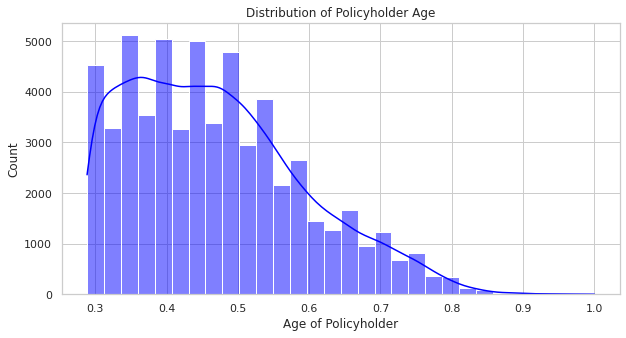

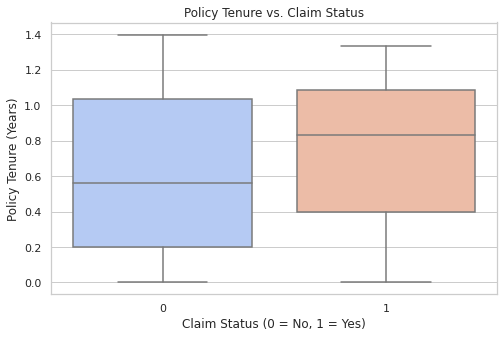

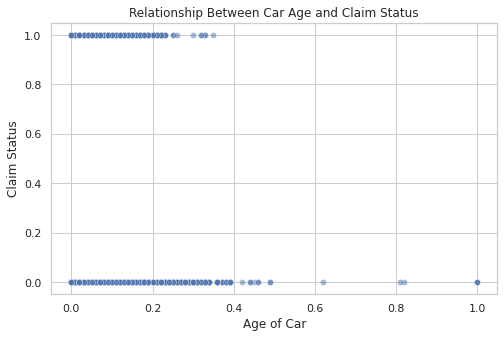

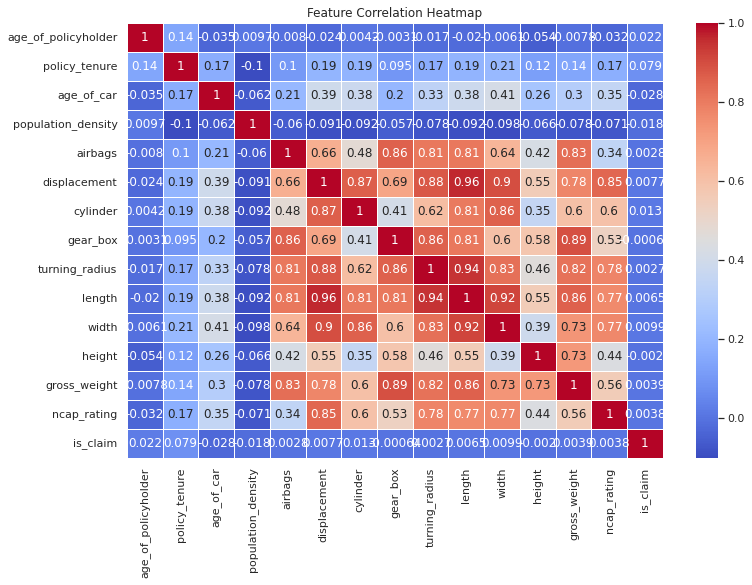

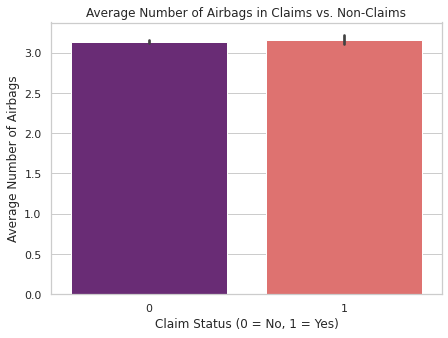

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrame to Pandas for visualization
df_pandas = df.select(
    "age_of_policyholder", "policy_tenure", "age_of_car", "population_density",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius",
    "length", "width", "height", "gross_weight", "ncap_rating", "is_claim"
).toPandas()

# Set Seaborn style
sns.set(style="whitegrid")

# 1️⃣ **Histogram: Distribution of Policyholder Age**
plt.figure(figsize=(10, 5))
sns.histplot(df_pandas["age_of_policyholder"], bins=30, kde=True, color="blue")
plt.title("Distribution of Policyholder Age")
plt.xlabel("Age of Policyholder")
plt.ylabel("Count")
plt.show()

# 2️⃣ **Boxplot: Policy Tenure vs. Claims**
plt.figure(figsize=(8, 5))
sns.boxplot(x="is_claim", y="policy_tenure", data=df_pandas, palette="coolwarm")
plt.title("Policy Tenure vs. Claim Status")
plt.xlabel("Claim Status (0 = No, 1 = Yes)")
plt.ylabel("Policy Tenure (Years)")
plt.show()

# 3️⃣ **Scatter Plot: Age of Car vs. Claim Status**
plt.figure(figsize=(8, 5))
sns.scatterplot(x="age_of_car", y="is_claim", data=df_pandas, alpha=0.5)
plt.title("Relationship Between Car Age and Claim Status")
plt.xlabel("Age of Car")
plt.ylabel("Claim Status")
plt.show()

# 4️⃣ **Correlation Heatmap: Numerical Feature Relationships**
plt.figure(figsize=(12, 8))
correlation_matrix = df_pandas.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# 5️⃣ **Bar Plot: Average Number of Airbags in Claims vs. Non-Claims**
plt.figure(figsize=(7, 5))
sns.barplot(x="is_claim", y="airbags", data=df_pandas, palette="magma")
plt.title("Average Number of Airbags in Claims vs. Non-Claims")
plt.xlabel("Claim Status (0 = No, 1 = Yes)")
plt.ylabel("Average Number of Airbags")
plt.show()

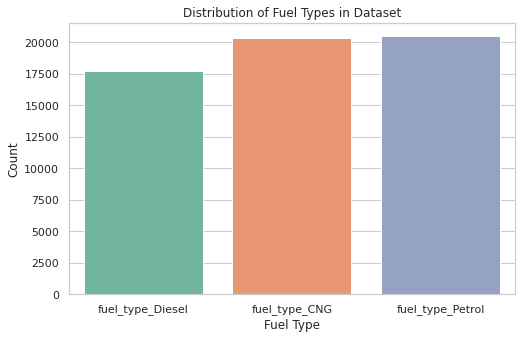

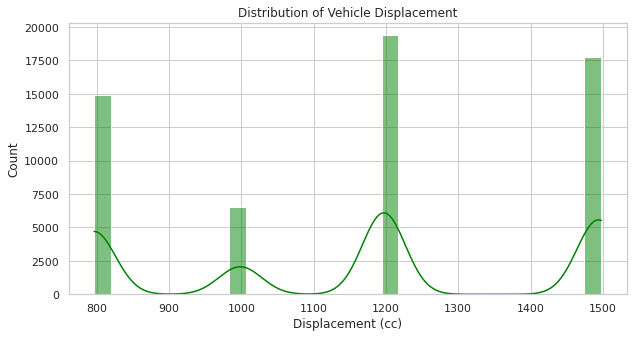

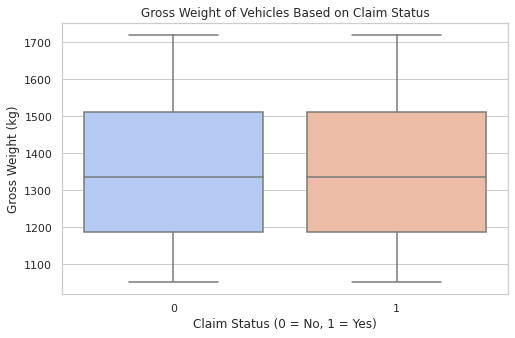

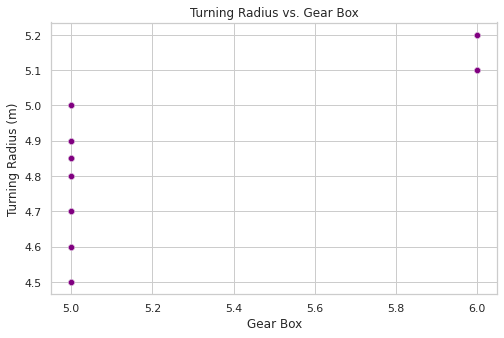

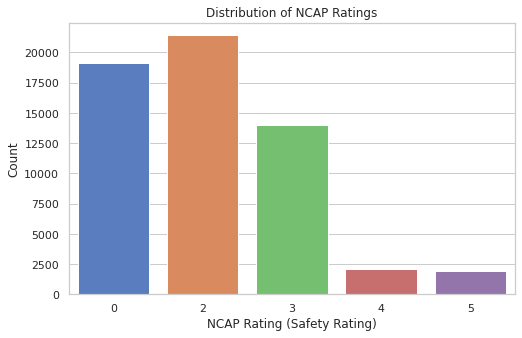

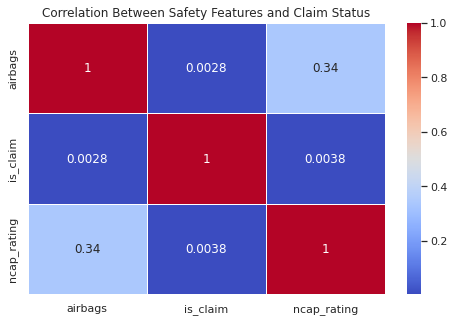

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrame to Pandas for visualization
df_pandas = df.select(
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius",
    "length", "width", "height", "gross_weight", "ncap_rating", "is_claim",
    "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc",
    "transmission_type_Automatic", "transmission_type_Manual",
    "steering_type_Power", "steering_type_Manual", "steering_type_Electric"
).toPandas()

# Set Seaborn style
sns.set(style="whitegrid")

# 1️⃣ **Bar Plot: Distribution of Fuel Types**
plt.figure(figsize=(8, 5))
fuel_counts = df_pandas[["fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol"]].sum()
sns.barplot(x=fuel_counts.index, y=fuel_counts.values, palette="Set2")
plt.title("Distribution of Fuel Types in Dataset")
plt.xlabel("Fuel Type")
plt.ylabel("Count")
plt.show()

# 2️⃣ **Histogram: Distribution of Vehicle Displacement**
plt.figure(figsize=(10, 5))
sns.histplot(df_pandas["displacement"], bins=30, kde=True, color="green")
plt.title("Distribution of Vehicle Displacement")
plt.xlabel("Displacement (cc)")
plt.ylabel("Count")
plt.show()

# 3️⃣ **Boxplot: Gross Weight of Vehicles Based on Claim Status**
plt.figure(figsize=(8, 5))
sns.boxplot(x="is_claim", y="gross_weight", data=df_pandas, palette="coolwarm")
plt.title("Gross Weight of Vehicles Based on Claim Status")
plt.xlabel("Claim Status (0 = No, 1 = Yes)")
plt.ylabel("Gross Weight (kg)")
plt.show()

# 4️⃣ **Scatter Plot: Turning Radius vs. Gear Box**
plt.figure(figsize=(8, 5))
sns.scatterplot(x="gear_box", y="turning_radius", data=df_pandas, alpha=0.5, color="purple")
plt.title("Turning Radius vs. Gear Box")
plt.xlabel("Gear Box")
plt.ylabel("Turning Radius (m)")
plt.show()

# 5️⃣ **Count Plot: NCAP Rating Distribution**
plt.figure(figsize=(8, 5))
sns.countplot(x="ncap_rating", data=df_pandas, palette="muted")
plt.title("Distribution of NCAP Ratings")
plt.xlabel("NCAP Rating (Safety Rating)")
plt.ylabel("Count")
plt.show()

# 6️⃣ **Correlation Heatmap: Safety Features vs. Claim Status**
safety_features = ["airbags", "is_claim", "ncap_rating"]
plt.figure(figsize=(8, 5))
sns.heatmap(df_pandas[safety_features].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Between Safety Features and Claim Status")
plt.show()

<Figure size 720x720 with 0 Axes>

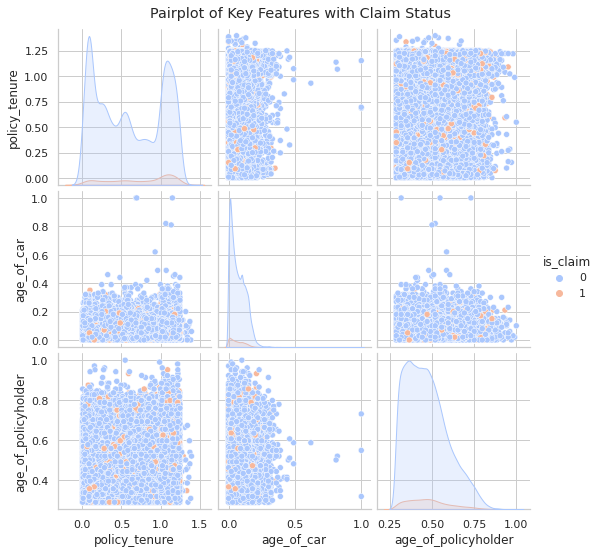

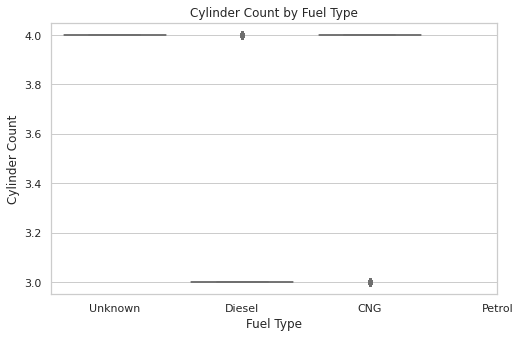

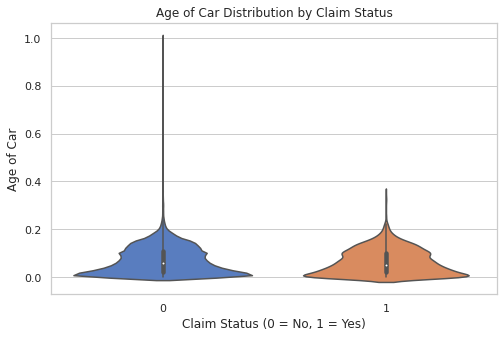

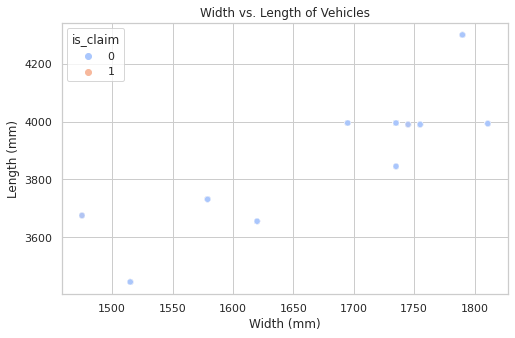

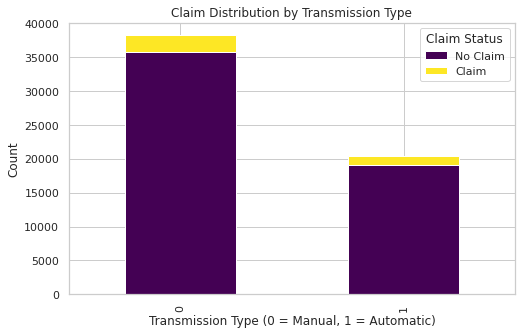

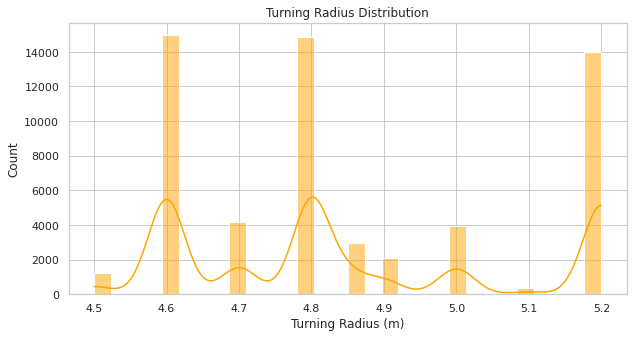

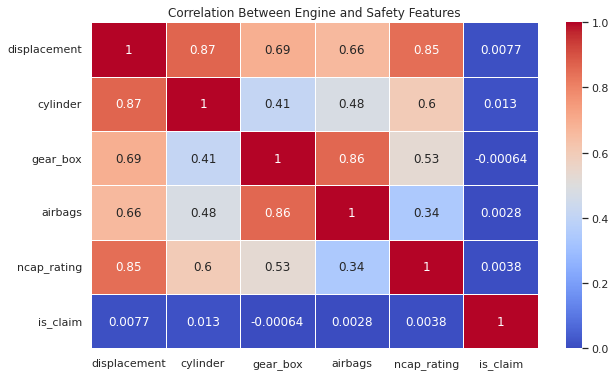

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrame to Pandas for visualization
df_pandas = df.select(
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius",
    "length", "width", "height", "gross_weight", "ncap_rating", "is_claim",
    "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc",
    "transmission_type_Automatic", "transmission_type_Manual",
    "steering_type_Power", "steering_type_Manual", "steering_type_Electric"
).toPandas()

# Set Seaborn style
sns.set(style="whitegrid")

# 1️⃣ **Pairplot: Key Numeric Features vs. Claims**
plt.figure(figsize=(10, 10))
sns.pairplot(df_pandas[["policy_tenure", "age_of_car", "age_of_policyholder", "is_claim"]], hue="is_claim", palette="coolwarm")
plt.suptitle("Pairplot of Key Features with Claim Status", y=1.02)
plt.show()

# 2️⃣ **Box Plot: Cylinder Count by Fuel Type**
plt.figure(figsize=(8, 5))
sns.boxplot(x=df_pandas["fuel_type_Diesel"] + df_pandas["fuel_type_CNG"] * 2 + df_pandas["fuel_type_Petrol"] * 3, 
            y=df_pandas["cylinder"], 
            palette="pastel")
plt.xticks([0, 1, 2, 3], ["Unknown", "Diesel", "CNG", "Petrol"])
plt.title("Cylinder Count by Fuel Type")
plt.xlabel("Fuel Type")
plt.ylabel("Cylinder Count")
plt.show()

# 3️⃣ **Violin Plot: Age of Car vs. Claim Status**
plt.figure(figsize=(8, 5))
sns.violinplot(x="is_claim", y="age_of_car", data=df_pandas, palette="muted")
plt.title("Age of Car Distribution by Claim Status")
plt.xlabel("Claim Status (0 = No, 1 = Yes)")
plt.ylabel("Age of Car")
plt.show()

# 4️⃣ **Scatter Plot: Width vs. Length of Vehicles**
plt.figure(figsize=(8, 5))
sns.scatterplot(x="width", y="length", hue="is_claim", data=df_pandas, alpha=0.6, palette="coolwarm")
plt.title("Width vs. Length of Vehicles")
plt.xlabel("Width (mm)")
plt.ylabel("Length (mm)")
plt.show()

# 5️⃣ **Stacked Bar Plot: Transmission Type and Claims**
transmission_claims = df_pandas.groupby(["transmission_type_Automatic", "is_claim"]).size().unstack()
transmission_claims.plot(kind="bar", stacked=True, figsize=(8, 5), colormap="viridis")
plt.title("Claim Distribution by Transmission Type")
plt.xlabel("Transmission Type (0 = Manual, 1 = Automatic)")
plt.ylabel("Count")
plt.legend(title="Claim Status", labels=["No Claim", "Claim"])
plt.show()

# 6️⃣ **Histogram: Turning Radius Distribution**
plt.figure(figsize=(10, 5))
sns.histplot(df_pandas["turning_radius"], bins=30, kde=True, color="orange")
plt.title("Turning Radius Distribution")
plt.xlabel("Turning Radius (m)")
plt.ylabel("Count")
plt.show()

# 7️⃣ **Heatmap: Correlation Between Engine & Safety Features**
engine_safety_features = ["displacement", "cylinder", "gear_box", "airbags", "ncap_rating", "is_claim"]
plt.figure(figsize=(10, 6))
sns.heatmap(df_pandas[engine_safety_features].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Between Engine and Safety Features")
plt.show()

### Key Insights 

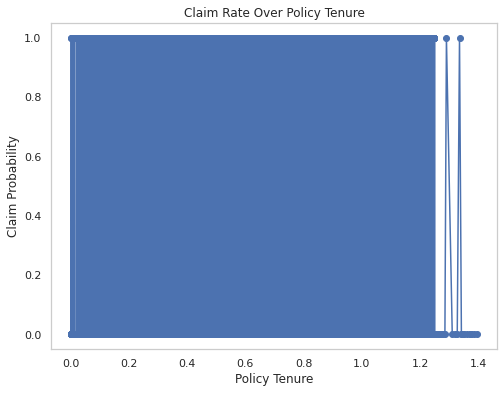

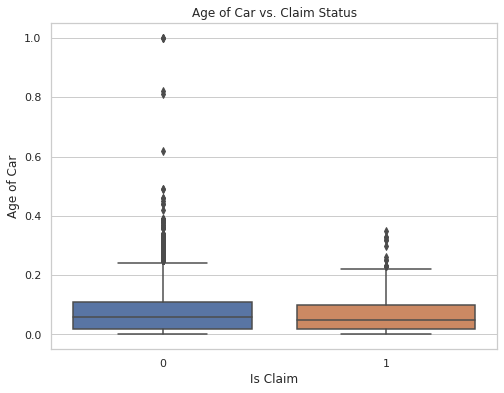

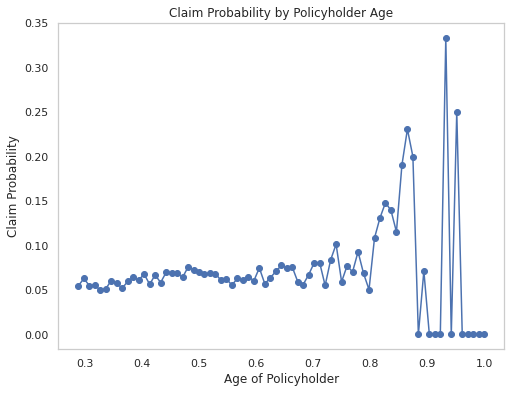

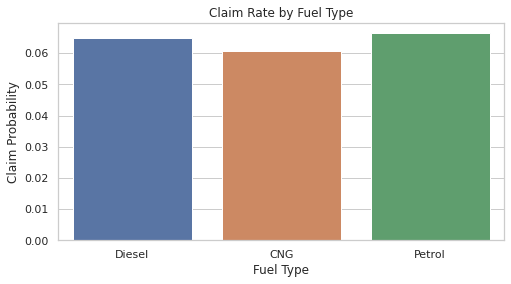

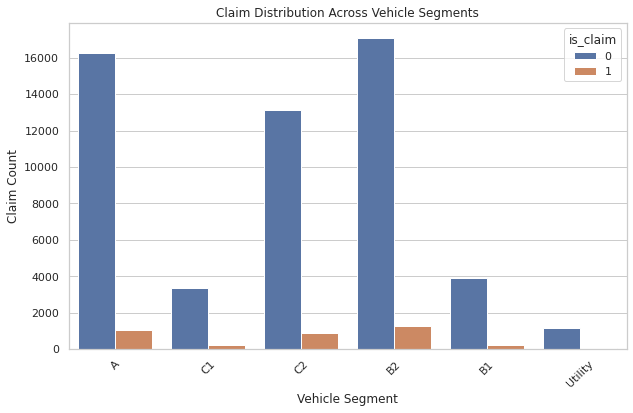

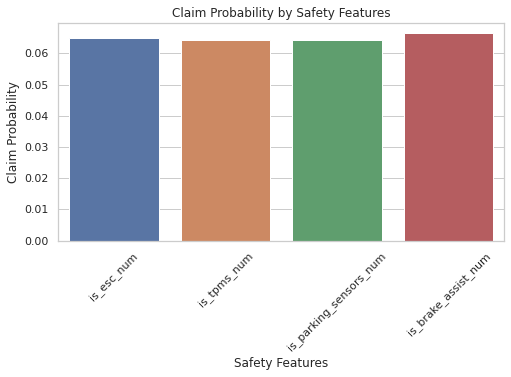

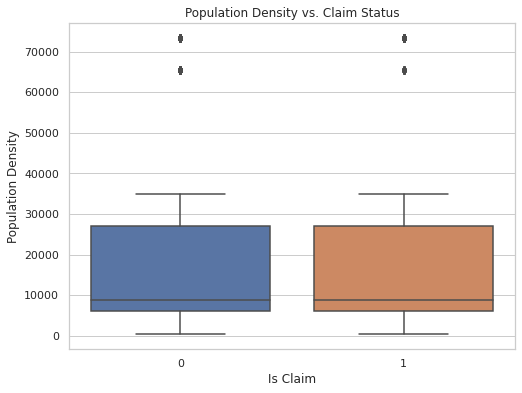

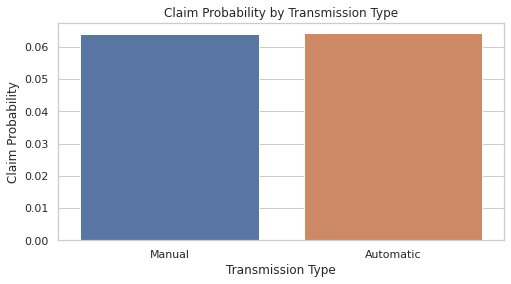

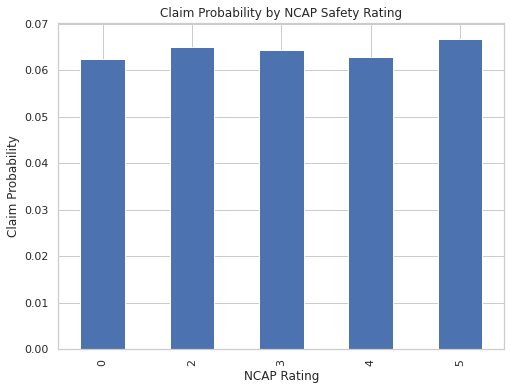

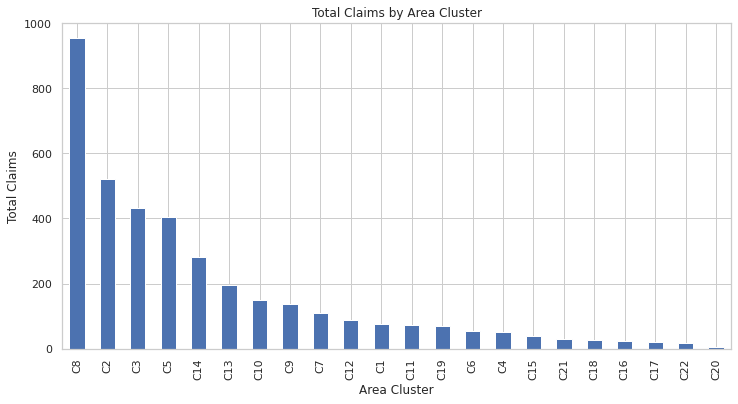

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert Spark DataFrame to Pandas for analysis
df_pandas = df.toPandas()  # Use df.toPandas() in Databricks

# Set visualization style
sns.set_style("whitegrid")

# Define numerical and categorical columns
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", 
    "make", "airbags", "displacement", "cylinder", "gear_box", "turning_radius", 
    "length", "width", "height", "gross_weight", "ncap_rating"
]

categorical_cols = ["segment", "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol", "area_cluster"]

# 1. Policy Tenure vs. Claim Probability
plt.figure(figsize=(8, 6))
df_pandas.groupby("policy_tenure")["is_claim"].mean().plot(kind="line", marker="o")
plt.title("Claim Rate Over Policy Tenure")
plt.xlabel("Policy Tenure")
plt.ylabel("Claim Probability")
plt.grid()
plt.show()

# 2. Age of Car vs. Claims
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_pandas["is_claim"], y=df_pandas["age_of_car"])
plt.title("Age of Car vs. Claim Status")
plt.xlabel("Is Claim")
plt.ylabel("Age of Car")
plt.show()

# 3. Age of Policyholder vs. Claim Rate
plt.figure(figsize=(8, 6))
df_pandas.groupby("age_of_policyholder")["is_claim"].mean().plot(kind="line", marker="o")
plt.title("Claim Probability by Policyholder Age")
plt.xlabel("Age of Policyholder")
plt.ylabel("Claim Probability")
plt.grid()
plt.show()

# 4. Fuel Type and Claims
plt.figure(figsize=(8, 4))
sns.barplot(x=["Diesel", "CNG", "Petrol"], 
            y=[df_pandas[df_pandas["fuel_type_Diesel"] == 1]["is_claim"].mean(),
               df_pandas[df_pandas["fuel_type_CNG"] == 1]["is_claim"].mean(),
               df_pandas[df_pandas["fuel_type_Petrol"] == 1]["is_claim"].mean()])
plt.title("Claim Rate by Fuel Type")
plt.xlabel("Fuel Type")
plt.ylabel("Claim Probability")
plt.show()

# 5. Vehicle Segment & Claim Frequency
plt.figure(figsize=(10, 6))
sns.countplot(x=df_pandas["segment"], hue=df_pandas["is_claim"])
plt.title("Claim Distribution Across Vehicle Segments")
plt.xlabel("Vehicle Segment")
plt.ylabel("Claim Count")
plt.xticks(rotation=45)
plt.show()

# 6. Safety Features and Claim Reduction
safety_features = ["is_esc_num", "is_tpms_num", "is_parking_sensors_num", "is_brake_assist_num"]
claim_rates = {feature: df_pandas[df_pandas[feature] == 1]["is_claim"].mean() for feature in safety_features}

plt.figure(figsize=(8, 4))
sns.barplot(x=list(claim_rates.keys()), y=list(claim_rates.values()))
plt.title("Claim Probability by Safety Features")
plt.xlabel("Safety Features")
plt.ylabel("Claim Probability")
plt.xticks(rotation=45)
plt.show()

# 7. Population Density vs. Claims
plt.figure(figsize=(8, 6))
sns.boxplot(x=df_pandas["is_claim"], y=df_pandas["population_density"])
plt.title("Population Density vs. Claim Status")
plt.xlabel("Is Claim")
plt.ylabel("Population Density")
plt.show()

# 8. Transmission Type and Claims
plt.figure(figsize=(8, 4))
sns.barplot(x=["Manual", "Automatic"], 
            y=[df_pandas[df_pandas["transmission_type_Manual"] == 1]["is_claim"].mean(),
               df_pandas[df_pandas["transmission_type_Automatic"] == 1]["is_claim"].mean()])
plt.title("Claim Probability by Transmission Type")
plt.xlabel("Transmission Type")
plt.ylabel("Claim Probability")
plt.show()

# 9. NCAP Rating vs. Claims
plt.figure(figsize=(8, 6))
df_pandas.groupby("ncap_rating")["is_claim"].mean().plot(kind="bar")
plt.title("Claim Probability by NCAP Safety Rating")
plt.xlabel("NCAP Rating")
plt.ylabel("Claim Probability")
plt.show()

# 10. Fraud Detection (High-Risk Clusters)
plt.figure(figsize=(12, 6))
df_pandas.groupby("area_cluster")["is_claim"].sum().sort_values(ascending=False).plot(kind="bar")
plt.title("Total Claims by Area Cluster")
plt.xlabel("Area Cluster")
plt.ylabel("Total Claims")
plt.xticks(rotation=90)
plt.show()

Insight	Business Action
Short policy tenure → More claims	Offer discounts for long-term policies
Older cars → Higher claims	Increase premiums for older vehicles
Young & Elderly drivers → More claims	Adjust premium pricing based on age
Diesel/Petrol → More claims	Lower premiums for CNG vehicles
Luxury vehicles → More claims	Increase premium pricing
Safety Features → Fewer claims	Offer discounts for safer vehicles
High-density areas → More claims	City-based pricing models
Manual cars → More claims	Lower premiums for automatic cars
Low NCAP rating → More claims	Encourage safe vehicle purchases
High-risk area clusters → Fraud Risk	AI-based fraud detection

## Phase 4: Predictive Modeling using Spark MLlib

Now the predictive modeling approach that would be used in this scenario for predicting is the insurance claim is CLASSIFICATION as the claim is binary. Its classification model because we are predicting whether a claim will be filed or not. 

Why Classification?
The target variable is_claim is categorical (0 or 1).
The goal is to classify policies as likely to file a claim or not.
Models like Logistic Regression, Decision Trees, Random Forest, XGBoost, and Neural Networks are well-suited for this.

In [0]:
# Display the top 5 rows of the DataFrame
df.show(5, truncate=False)

+---------+-----------------+----------+-------------------+------------+------------------+----+-------+-----+-------------+----------------+------------------+-------+------------+--------+--------+--------------+------+-----+------+------------+-----------+--------+----------------+-------------+----------------+---------------------+---------------------+---------------------------+------------------------+-------------------+--------------------+----------------------+----------+--------------------------+-----------+----------------------+---------------------+-----------------------+------------------------+-------------------------+---------------------------+-------------------+-----------------------+----------------------+---------------------+------------------------------------+---------------------------------+----------+------------------+
|policy_id|policy_tenure    |age_of_car|age_of_policyholder|area_cluster|population_density|make|segment|model|max_torque   |max_powe

In [0]:
df.printSchema() 

root
 |-- policy_id: string (nullable = true)
 |-- policy_tenure: double (nullable = true)
 |-- age_of_car: double (nullable = true)
 |-- age_of_policyholder: double (nullable = true)
 |-- area_cluster: string (nullable = true)
 |-- population_density: integer (nullable = true)
 |-- make: integer (nullable = true)
 |-- segment: string (nullable = true)
 |-- model: string (nullable = true)
 |-- max_torque: string (nullable = true)
 |-- max_power: string (nullable = true)
 |-- engine_type: string (nullable = true)
 |-- airbags: integer (nullable = true)
 |-- displacement: integer (nullable = true)
 |-- cylinder: integer (nullable = true)
 |-- gear_box: integer (nullable = true)
 |-- turning_radius: double (nullable = true)
 |-- length: integer (nullable = true)
 |-- width: integer (nullable = true)
 |-- height: integer (nullable = true)
 |-- gross_weight: integer (nullable = true)
 |-- ncap_rating: integer (nullable = true)
 |-- is_claim: integer (nullable = true)
 |-- fuel_type_Diesel: 

#### Predictive Model

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

# Initialize Spark Session
spark = SparkSession.builder.appName("InsuranceClaimPrediction").getOrCreate()

# ---------------------- 1. Data Preparation ----------------------
# Drop unnecessary ID column
df = df.drop("policy_id")

# Convert categorical columns to indexed numerical columns
categorical_cols = ["area_cluster", "segment", "model", "max_torque", "max_power", "engine_type"]
for col_name in categorical_cols:
    indexer = StringIndexer(inputCol=col_name, outputCol=col_name + "_index", handleInvalid="keep")
    df = indexer.fit(df).transform(df)

# Define numerical columns for feature engineering
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", "make",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius", "length", "width", 
    "height", "gross_weight", "ncap_rating", "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc", "transmission_type_Automatic", 
    "transmission_type_Manual", "steering_type_Power", "steering_type_Manual", 
    "steering_type_Electric", "is_esc_num", "is_adjustable_steering_num", "is_tpms_num",
    "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num",
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num",
    "is_brake_assist_num", "is_power_door_locks_num", "is_central_locking_num",
    "is_power_steering_num", "is_driver_seat_height_adjustable_num",
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# Final feature columns including encoded categorical features
feature_cols = numerical_cols + [col + "_index" for col in categorical_cols]

# VectorAssembler to create feature vector
assembler = VectorAssembler(inputCols=feature_cols, outputCol="raw_features")
df = assembler.transform(df)

# StandardScaler to normalize features
scaler = StandardScaler(inputCol="raw_features", outputCol="features")
scaler_model = scaler.fit(df)
df = scaler_model.transform(df)

# ---------------------- 2. Train-Test Split ----------------------
train_data, test_data = df.randomSplit([0.8, 0.2], seed=42)

# ---------------------- 3. Train Random Forest Model ----------------------
rf = RandomForestClassifier(labelCol="is_claim", featuresCol="features", numTrees=50, maxDepth=10)

# ---------------------- 4. Hyperparameter Tuning (Cross-Validation) ----------------------
paramGrid = ParamGridBuilder() \
    .addGrid(rf.numTrees, [20, 50, 100]) \
    .addGrid(rf.maxDepth, [5, 10, 15]) \
    .build()

evaluator = BinaryClassificationEvaluator(labelCol="is_claim", metricName="areaUnderROC")

crossval = CrossValidator(estimator=rf,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=5)

# Fit the model
cv_model = crossval.fit(train_data)

# ---------------------- 5. Model Evaluation ----------------------
predictions = cv_model.transform(test_data)

# Evaluate using multiple classification metrics
binary_evaluator = BinaryClassificationEvaluator(labelCol="is_claim", metricName="areaUnderROC")
auc = binary_evaluator.evaluate(predictions)

pr_evaluator = BinaryClassificationEvaluator(labelCol="is_claim", metricName="areaUnderPR")
pr_auc = pr_evaluator.evaluate(predictions)

multiclass_evaluator = MulticlassClassificationEvaluator(labelCol="is_claim", predictionCol="prediction")
accuracy = multiclass_evaluator.evaluate(predictions, {multiclass_evaluator.metricName: "accuracy"})
precision = multiclass_evaluator.evaluate(predictions, {multiclass_evaluator.metricName: "precisionByLabel"})
recall = multiclass_evaluator.evaluate(predictions, {multiclass_evaluator.metricName: "recallByLabel"})
f1_score = multiclass_evaluator.evaluate(predictions, {multiclass_evaluator.metricName: "f1"})

# ---------------------- 6. Print Model Performance Metrics ----------------------
print(f"📊 Model Performance Metrics:")
print(f"✔ AUC-ROC Score: {auc:.4f}")
print(f"✔ AUC-PR Score: {pr_auc:.4f}")
print(f"✔ Accuracy: {accuracy:.4f}")
print(f"✔ Precision: {precision:.4f}")
print(f"✔ Recall: {recall:.4f}")
print(f"✔ F1 Score: {f1_score:.4f}")

📊 Model Performance Metrics:
✔ AUC-ROC Score: 0.6557
✔ AUC-PR Score: 0.1016
✔ Accuracy: 0.9353
✔ Precision: 0.9353
✔ Recall: 1.0000
✔ F1 Score: 0.9041


## Phase 5: MLOps Best Practices - Pipelines & MLflow

In [0]:
%pip install mlflow

Python interpreter will be restarted.
  Attempting uninstall: typing-extensions
    Found existing installation: typing-extensions 4.1.1
    Not uninstalling typing-extensions at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-18078b93-7f6b-45e6-bfe5-4879f1d3ef0b
    Can't uninstall 'typing-extensions'. No files were found to uninstall.
  Attempting uninstall: requests
    Found existing installation: requests 2.27.1
    Not uninstalling requests at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-18078b93-7f6b-45e6-bfe5-4879f1d3ef0b
    Can't uninstall 'requests'. No files were found to uninstall.
  Attempting uninstall: MarkupSafe
    Found existing installation: MarkupSafe 2.0.1
    Not uninstalling markupsafe at /databricks/python3/lib/python3.9/site-packages, outside environment /local_disk0/.ephemeral_nfs/envs/pythonEnv-18078b93-7f6b-45e6-bfe5-4879f1d3ef0

Below pipeline is mlflow for whole data but as it is taking more than 9 hrs to run it, we have used only 1% data in the next mlflow to get the results

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import mlflow
import mlflow.spark

# Initialize Spark Session (In Databricks, Spark session is pre-configured)
spark = SparkSession.builder.appName("AutomatedInsuranceClaimPrediction").getOrCreate()

# Enable MLflow Tracking
mlflow.set_experiment("/Users/ramyapolineni@gmail.com/Project /insurance_prediction")

# ---------------------- 1. Load Data ----------------------
df = spark.read.format("parquet").load("dbfs:/user/hive/warehouse/insurance_policies_parquet_nn")

# ✅ Step 1: List of Binary Columns to Convert from String to Integer
binary_columns = [
    "is_esc_num", "is_adjustable_steering_num", "is_tpms_num", "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num", 
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num", "is_brake_assist_num", 
    "is_power_door_locks_num", "is_central_locking_num", "is_power_steering_num", "is_driver_seat_height_adjustable_num", 
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# ✅ Convert String Binary Columns ("0"/"1") to Integer
for column in binary_columns:
    df = df.withColumn(column, col(column).cast("integer"))

# ✅ Step 2: Drop Unnecessary Categorical Columns
columns_to_drop = ["fuel_type", "rear_brakes_type", "transmission_type", "steering_type", "is_esc", "is_adjustable_steering", "is_tpms", "is_parking_sensors","is_parking_camera", "is_front_fog_lights", 
    "is_rear_window_wiper", "is_rear_window_washer", "is_rear_window_defogger", "is_brake_assist", 
    "is_power_door_locks", "is_central_locking", "is_power_steering", "is_driver_seat_height_adjustable", 
    "is_day_night_rear_view_mirror", "is_ecw", "is_speed_alert"]
df = df.drop(*columns_to_drop)

# Drop unnecessary ID column
df = df.drop("policy_id")

# ---------------------- 2. Define Pipeline Stages ----------------------
# Categorical Feature Encoding
categorical_cols = ["area_cluster", "segment", "model", "max_torque", "max_power", "engine_type"]
indexers = [StringIndexer(inputCol=col, outputCol=col + "_index", handleInvalid="keep") for col in categorical_cols]

# Numerical Features
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", "make",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius", "length", "width", 
    "height", "gross_weight", "ncap_rating", "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc", "transmission_type_Automatic", 
    "transmission_type_Manual", "steering_type_Power", "steering_type_Manual", 
    "steering_type_Electric", "is_esc_num", "is_adjustable_steering_num", "is_tpms_num",
    "is_parking_sensors_num", "is_parking_camera_num", "is_front_fog_lights_num",
    "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num",
    "is_brake_assist_num", "is_power_door_locks_num", "is_central_locking_num",
    "is_power_steering_num", "is_driver_seat_height_adjustable_num",
    "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

# Assemble Features
feature_cols = numerical_cols + [col + "_index" for col in categorical_cols]
assembler = VectorAssembler(inputCols=feature_cols, outputCol="raw_features")

# StandardScaler for Feature Normalization
scaler = StandardScaler(inputCol="raw_features", outputCol="features")

# Define GBT Classifier
gbt = GBTClassifier(labelCol="is_claim", featuresCol="features", maxIter=50, maxDepth=10)

# Define Pipeline
pipeline = Pipeline(stages=indexers + [assembler, scaler, gbt])

# ---------------------- 3. Train-Test Split ----------------------
train_data, test_data = df.randomSplit([0.8, 0.2], seed=42)

# ---------------------- 4. Hyperparameter Tuning (Cross-Validation) ----------------------
paramGrid = ParamGridBuilder() \
    .addGrid(gbt.maxIter, [50, 100]) \
    .addGrid(gbt.maxDepth, [5, 10, 15]) \
    .build()

evaluator = BinaryClassificationEvaluator(labelCol="is_claim", metricName="areaUnderROC")

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=5)

# ---------------------- 5. MLflow Tracking ----------------------
with mlflow.start_run():
    # Train Model
    cv_model = crossval.fit(train_data)
    
    # Save Best Model
    mlflow.spark.log_model(cv_model.bestModel, "best_model")
    
    # Predictions
    predictions = cv_model.transform(test_data)
    
    # Evaluate Metrics
    auc = evaluator.evaluate(predictions)
    accuracy = MulticlassClassificationEvaluator(labelCol="is_claim", metricName="accuracy").evaluate(predictions)
    precision = MulticlassClassificationEvaluator(labelCol="is_claim", metricName="precisionByLabel").evaluate(predictions)
    recall = MulticlassClassificationEvaluator(labelCol="is_claim", metricName="recallByLabel").evaluate(predictions)
    f1_score = MulticlassClassificationEvaluator(labelCol="is_claim", metricName="f1").evaluate(predictions)

    # Log Metrics in MLflow
    mlflow.log_param("Algorithm", "Gradient Boosted Trees")
    mlflow.log_param("Max Iterations", cv_model.bestModel.stages[-1].getMaxIter())
    mlflow.log_param("Max Depth", cv_model.bestModel.stages[-1].getMaxDepth())
    mlflow.log_metric("AUC-ROC", auc)
    mlflow.log_metric("Accuracy", accuracy)
    mlflow.log_metric("Precision", precision)
    mlflow.log_metric("Recall", recall)
    mlflow.log_metric("F1 Score", f1_score)

    print(f"✔ AUC-ROC: {auc:.4f}, Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1_score:.4f}")

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.ml import Pipeline
from pyspark.ml.feature import VectorAssembler, StringIndexer, StandardScaler
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator, MulticlassClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import mlflow
import mlflow.spark

# ✅ Initialize Spark Session
spark = SparkSession.builder.appName("FastInsuranceClaimPrediction").getOrCreate()

# ✅ Enable MLflow Tracking
mlflow.set_experiment("/Users/ramyapolineni@gmail.com/Project /insurance_prediction")

# ---------------------- 1. Load Small Data Sample ----------------------
df = spark.read.format("parquet").load("dbfs:/user/hive/warehouse/insurance_policies_parquet_nn")

# ✅ Use only 1% of the data to speed up execution
df = df.sample(fraction=0.01, seed=42)

# ✅ Convert String Binary Columns ("0"/"1") to Integer
binary_columns = [
    "is_esc_num", "is_adjustable_steering_num", "is_tpms_num", "is_parking_sensors_num", "is_parking_camera_num", 
    "is_front_fog_lights_num", "is_rear_window_wiper_num", "is_rear_window_washer_num", "is_rear_window_defogger_num", 
    "is_brake_assist_num", "is_power_door_locks_num", "is_central_locking_num", "is_power_steering_num", 
    "is_driver_seat_height_adjustable_num", "is_day_night_rear_view_mirror_num", "is_ecw_num", "is_speed_alert_num"
]

for column in binary_columns:
    df = df.withColumn(column, col(column).cast("integer"))

# ✅ Drop Unnecessary Columns
columns_to_drop = ["fuel_type", "rear_brakes_type", "transmission_type", "steering_type", "policy_id"]
df = df.drop(*columns_to_drop)

# ---------------------- 2. Define Pipeline Stages ----------------------
# ✅ Encode Categorical Features
categorical_cols = ["area_cluster", "segment", "model", "max_torque", "max_power", "engine_type"]
indexers = [StringIndexer(inputCol=col, outputCol=col + "_index", handleInvalid="keep") for col in categorical_cols]

# ✅ Define Feature Columns
numerical_cols = [
    "policy_tenure", "age_of_car", "age_of_policyholder", "population_density", "make",
    "airbags", "displacement", "cylinder", "gear_box", "turning_radius", "length", "width", 
    "height", "gross_weight", "ncap_rating", "fuel_type_Diesel", "fuel_type_CNG", "fuel_type_Petrol",
    "rear_brakes_type_Drum", "rear_brakes_type_Disc", "transmission_type_Automatic", 
    "transmission_type_Manual", "steering_type_Power", "steering_type_Manual", 
    "steering_type_Electric"
] + binary_columns

feature_cols = numerical_cols + [col + "_index" for col in categorical_cols]

# ✅ Assemble Features
assembler = VectorAssembler(inputCols=feature_cols, outputCol="raw_features")

# ✅ Normalize Features
scaler = StandardScaler(inputCol="raw_features", outputCol="features")

# ✅ Define GBT Classifier (Smaller Iterations & Depth for Faster Training)
gbt = GBTClassifier(labelCol="is_claim", featuresCol="features", maxIter=10, maxDepth=5)

# ✅ Define Pipeline
pipeline = Pipeline(stages=indexers + [assembler, scaler, gbt])

# ---------------------- 3. Train-Test Split ----------------------
train_data, test_data = df.randomSplit([0.8, 0.2], seed=42)

# ---------------------- 4. Hyperparameter Tuning (Reduced Grid for Speed) ----------------------
paramGrid = ParamGridBuilder() \
    .addGrid(gbt.maxIter, [10, 20]) \
    .addGrid(gbt.maxDepth, [3, 5]) \
    .build()

evaluator = BinaryClassificationEvaluator(labelCol="is_claim", metricName="areaUnderROC")

crossval = CrossValidator(estimator=pipeline,
                          estimatorParamMaps=paramGrid,
                          evaluator=evaluator,
                          numFolds=3)  # ✅ Reduce folds for faster tuning

# ---------------------- 5. MLflow Tracking ----------------------
with mlflow.start_run():
    # ✅ Train Model on Small Sample
    cv_model = crossval.fit(train_data)
    
    # ✅ Save Best Model
    mlflow.spark.log_model(cv_model.bestModel, "best_model")
    
    # ✅ Make Predictions
    predictions = cv_model.transform(test_data)
    
    # ✅ Evaluate Performance
    auc = evaluator.evaluate(predictions)
    accuracy = MulticlassClassificationEvaluator(labelCol="is_claim", metricName="accuracy").evaluate(predictions)

    # ✅ Log Metrics in MLflow
    mlflow.log_param("Algorithm", "Gradient Boosted Trees")
    mlflow.log_param("Max Iterations", cv_model.bestModel.stages[-1].getMaxIter())
    mlflow.log_param("Max Depth", cv_model.bestModel.stages[-1].getMaxDepth())
    mlflow.log_metric("AUC-ROC", auc)
    mlflow.log_metric("Accuracy", accuracy)

    print(f"✔ AUC-ROC: {auc:.4f}, Accuracy: {accuracy:.4f}")

2025/03/03 16:44:01 INFO mlflow.spark: Inferring pip requirements by reloading the logged model from the databricks artifact repository, which can be time-consuming. To speed up, explicitly specify the conda_env or pip_requirements when calling log_model().
2025/03/03 16:44:32 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: dbfs:/databricks/mlflow-tracking/3717512278373655/382c8d8350f0405586ae26f609cef701/artifacts/best_model/sparkml, flavor: spark). Fall back to return ['pyspark==3.3.2', 'pandas<2']. Set logging level to DEBUG to see the full traceback. 


✔ AUC-ROC: 0.5521, Accuracy: 0.9032
